In [2]:
import time
%matplotlib notebook
import pickle

from IPython.core.display import display, HTML
import numpy as np
from scipy import linalg
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import cv2
from collections import Counter
import pg_fitter_tools as fit
import sk_geo_tools as sk
import math


11 600


<IPython.core.display.Javascript object>


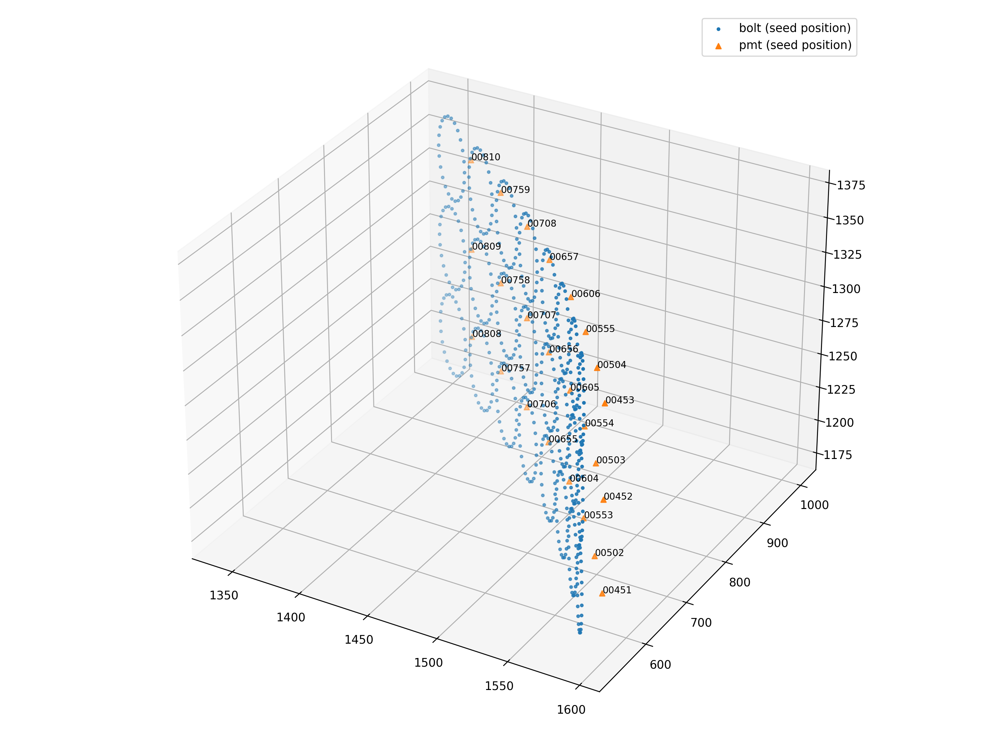

<IPython.core.display.Javascript object>


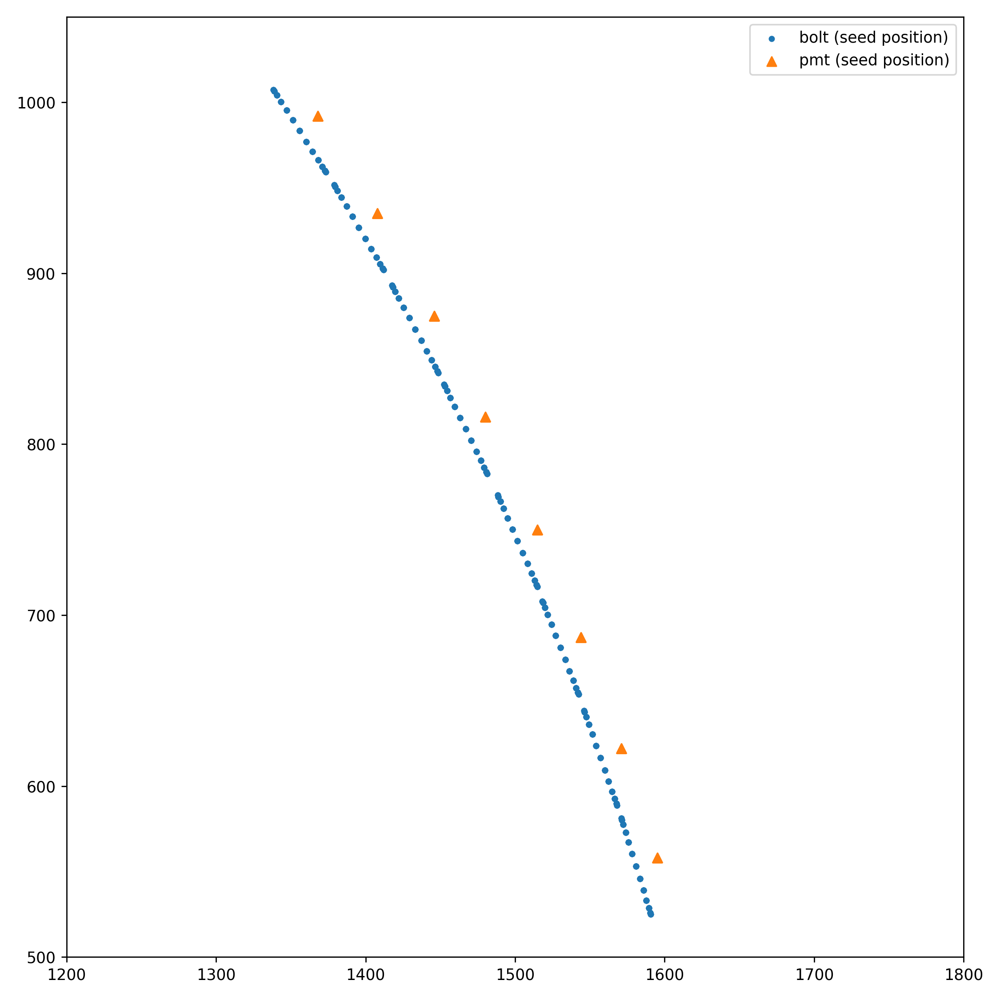

image 0 reprojection errors:    average: 5.16942540825156    max: 19.38033063180207
image 1 reprojection errors:    average: 6.214154258659956    max: 20.915670894775456
image 2 reprojection errors:    average: 5.947161169224219    max: 17.013961509197816
image 3 reprojection errors:    average: 5.351698763171741    max: 20.27404594018243
image 4 reprojection errors:    average: 4.946696128251078    max: 17.9454431090458
image 5 reprojection errors:    average: 4.026847864991318    max: 14.342444256907616
image 6 reprojection errors:    average: 5.572916897065595    max: 17.863006178395942
image 7 reprojection errors:    average: 5.540035279484816    max: 18.92732540113318
image 8 reprojection errors:    average: 5.2202097383643675    max: 20.139144598350335
image 9 reprojection errors:    average: 2.6701520537826893    max: 9.899751484782106
image 10 reprojection errors:    average: 2.738893874607554    max: 9.264794321334225


<IPython.core.display.Javascript object>


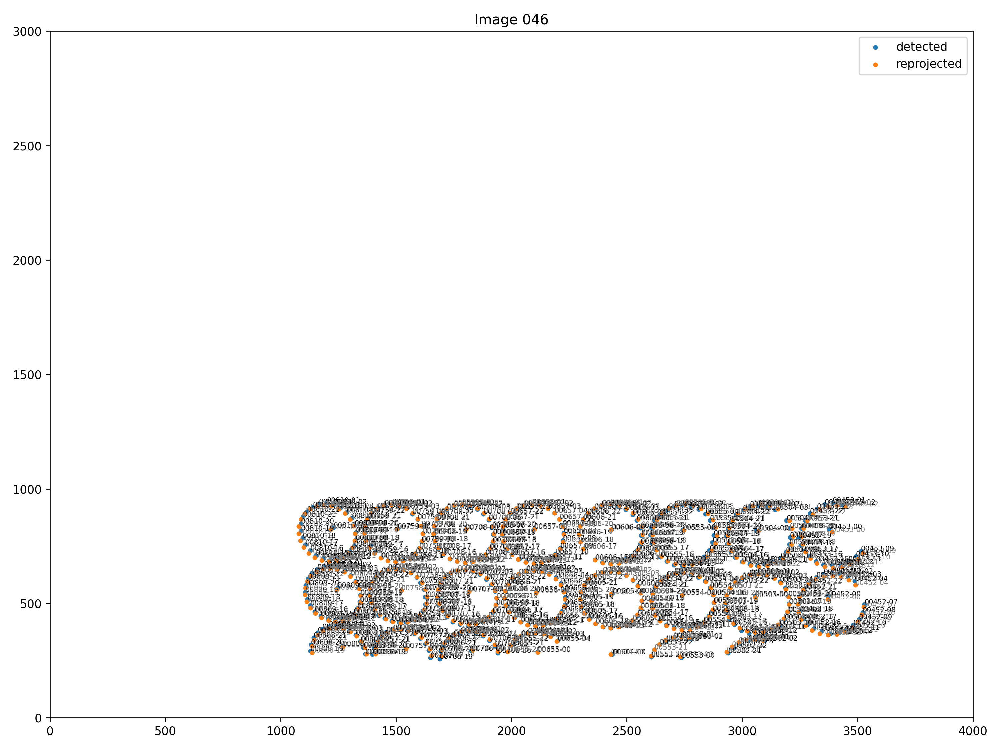

<IPython.core.display.Javascript object>


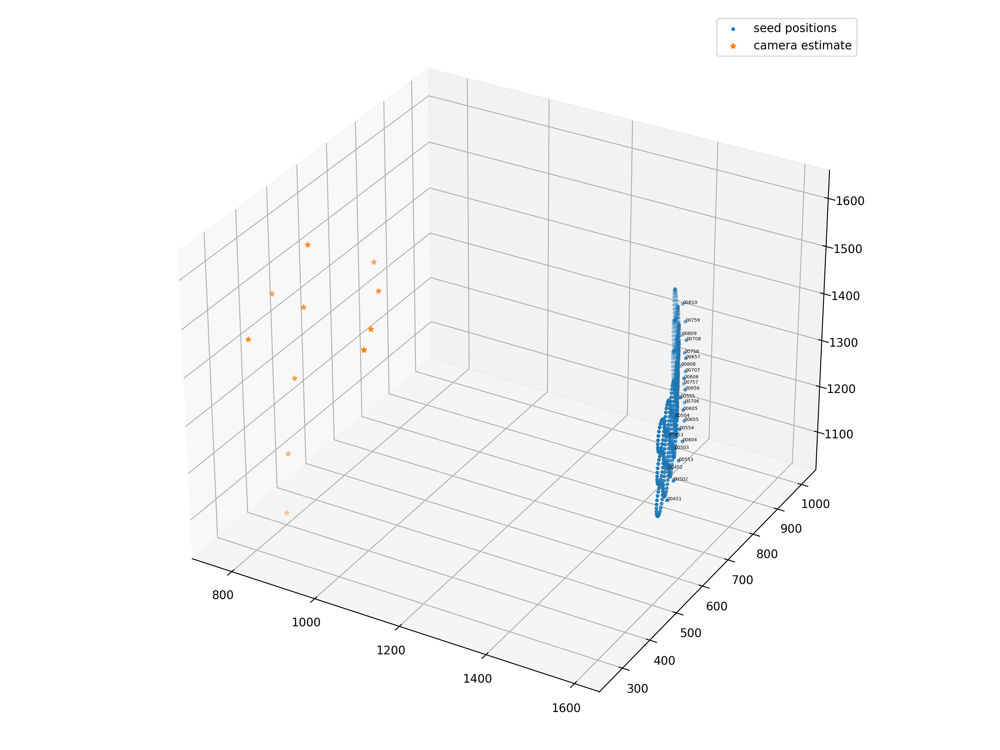

In [3]:

focal_length = [2.760529621789217e+03, 2.767014510543478e+03]
principle_point = [1.914303537872458e+03, 1.596386868474348e+03]
radial_distortion = [-0.2398, 0.1145]
tangential_distortion = [0, 0]

all_pmt_locations = fit.read_3d_feature_locations("parameters/SK_all_PMT_locations.txt")
all_bolt_locations = sk.get_bolt_locations_barrel(all_pmt_locations)
#offset = np.array([0, 250])
offset = np.array([0, 0])
image_feature_locations = {}
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/045.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/046.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/047.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/048.txt", offset=offset))

image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/086.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/087.txt", offset=offset))

#Always commented out:
#image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/124.txt", offset=offset))
#image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/125.txt", offset=offset))
#image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/126.txt", offset=offset))
#image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/127.txt", offset=offset))


image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/236.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/237.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/238.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/239.txt", offset=offset))
image_feature_locations.update(fit.read_image_feature_locations("BarrelSurveyFar_TopInjector_PD3/BarrelSurveyFar_TopInjector_median_texts/240.txt", offset=offset))
# swap out -25 and -00 for features in images where both exist
for im in image_feature_locations.values():
    for feat, loc in im.items():
        if feat[-2:] == "00" and feat[:-2]+"25" in im:
            tmp = loc
            im[feat] = im[feat[:-2]+"25"]
            im[feat[:-2]+"25"] = tmp


# choose features that appear in 2+ 
feature_counts = Counter([f for i in image_feature_locations.values() for f in i.keys()])
common_features = [f for f in feature_counts if feature_counts[f] > 1]
pmt_locations = {k: p for k, p in all_pmt_locations.items() if k in common_features}

# generate bolt locations from PMT locations
bolt_locations = sk.get_bolt_locations_barrel(pmt_locations)
common_feature_locations = {**pmt_locations, **bolt_locations}
common_image_pmt_locations = {
    k: {j: f for j, f in i.items() if j in common_features and j in pmt_locations}
    for k, i in image_feature_locations.items()}
common_image_feature_locations = {
    k: {j: f for j, f in i.items() if j in common_features and j in common_feature_locations}
    for k, i in image_feature_locations.items()}
common_image_bolt_locations = {
    k: {j: f for j, f in i.items() if j in common_features and j in bolt_locations}
    for k, i in image_feature_locations.items()}
nimages = len(common_image_feature_locations)
nfeatures = len(common_feature_locations)
print(nimages, nfeatures)


fig = plt.figure(figsize=(12,9))
ax = fig.add_subplot(111, projection='3d')
bolt_array = np.stack(list(bolt_locations.values()))
pmt_array = np.stack(list(pmt_locations.values()))
ax.scatter(bolt_array[:,0], bolt_array[:,1], bolt_array[:,2], marker='.', label="bolt (seed position)")
ax.scatter(pmt_array[:,0], pmt_array[:,1], pmt_array[:,2], marker='^', label="pmt (seed position)")
for i, f in enumerate(pmt_locations.keys()):
    ax.text(pmt_array[i,0], pmt_array[i,1], pmt_array[i,2], f[:5], size=8, zorder=4, color='k') 
plt.legend(loc=0)
fig.tight_layout()
plt.show()



fig, ax = plt.subplots(figsize=(9,9))
bolt_array = np.stack(list(bolt_locations.values()))
pmt_array = np.stack(list(pmt_locations.values()))
ax.scatter(bolt_array[:,0], bolt_array[:,1], marker='.', label="bolt (seed position)")
ax.scatter(pmt_array[:,0], pmt_array[:,1], marker='^', label="pmt (seed position)")
ax.set_ylim((500,1050))
ax.set_xlim((1200,1800))
plt.legend(loc=0)
fig.tight_layout()


fitter_pmts = fit.PhotogrammetryFitter(common_image_pmt_locations, pmt_locations,
                                       focal_length, principle_point, radial_distortion)
#fitter_bolts = fit.PhotogrammetryFitter(common_image_bolt_locations, common_feature_locations,
                                       #focal_length, principle_point, radial_distortion)
fitter_all = fit.PhotogrammetryFitter(common_image_feature_locations, common_feature_locations,
                                       focal_length, principle_point, radial_distortion)


camera_rotations, camera_translations, reprojected_points = fitter_all.estimate_camera_poses(flags=cv2.SOLVEPNP_EPNP)
#print(camera_rotations,"\n",camera_translations)



bolt_locations = sk.get_bolt_locations_barrel(pmt_locations)


test_image = 1
fig, ax = plt.subplots(figsize=(12,9))
coords = np.stack(list(common_image_feature_locations[fitter_pmts.index_image[test_image]].values()))
repro_coords = np.stack(list(reprojected_points[fitter_pmts.index_image[test_image]].values()))
ax.scatter(coords[:,0], 3000-coords[:,1], marker='.', label='detected')
ax.scatter(repro_coords[:,0], 3000-repro_coords[:,1], marker='.', label='reprojected')
for t, f in common_image_feature_locations[fitter_pmts.index_image[test_image]].items():
    ax.text(f[0], 3000-f[1], t, size=6, zorder=4, color='k')
for t, f in reprojected_points[fitter_pmts.index_image[test_image]].items():
    ax.text(f[0], 3000-f[1], t, size=6, zorder=4, color='gray')
ax.set_title("Image {}".format(fitter_pmts.index_image[test_image]))
ax.set_ylim(0, 3000)
ax.set_xlim(0, 4000)
plt.legend(loc=0)
fig.tight_layout()


camera_orientations, camera_positions = fit.camera_world_poses(camera_rotations, camera_translations)
fig = plt.figure(figsize=(12,9))
pmt_array = np.stack(list(pmt_locations.values()))
feat_array = np.stack(list(common_feature_locations.values()))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(feat_array[:,0], feat_array[:,1], feat_array[:,2], marker='.', label="seed positions", zorder=2)
for i, f in enumerate(pmt_locations.keys()):
    ax.text(pmt_array[i,0], pmt_array[i,1], pmt_array[i,2], f[:5], size=4, zorder=4, color='k') 
ax.scatter(camera_positions[:,0], camera_positions[:,1], camera_positions[:,2], marker='*', label="camera estimate", zorder=1)
plt.legend(loc=0)
fig.tight_layout()


In [6]:
print("started")
initialTime = time.perf_counter()
camera_rotations, camera_translations, reco_locations = fitter_all.bundle_adjustment(camera_rotations, camera_translations)
print("ended")
print("Time taken for reconstruction fitter (seconds): ", time.perf_counter()-initialTime)

started
seed_feature 600
camera_rotations=
 [ 1.5375128  -0.70308964  0.57051221  1.51866624 -0.76826861  0.64427387
  1.4896336  -0.81605339  0.72442043  1.43863339 -0.95678802  0.87061163
  1.57594347 -0.9353404   0.7151123   1.51510837 -1.04908377  0.8284999
  1.5675655  -0.89454441  0.69588455  1.57558667 -0.92067154  0.69481887
  1.57538806 -0.91212733  0.70616295  1.50835193 -0.8748124   0.74666032
  1.51228261 -0.88024723  0.74744225]
camera_translations=
 [-142.68451679 1619.59448337 -908.57052289 -185.15488902 1626.26076905
 -921.54663445 -248.06389173 1600.88888981 -949.53195404 -145.54943227
 1605.10672827 -978.2127987    35.03065599 1633.00486329 -554.20275314
  -14.93621113 1623.69809747 -559.61454809  -51.60902252 1764.91227901
 -642.36598026  -40.6905212  1655.42496731 -623.87376654  -82.75829692
 1516.30497303 -640.60712138  -73.73270076 1288.73851391 -759.12995465
  -65.48819562 1159.74386739 -760.48537604]
x0=== 1866
`ftol` termination condition is satisfied.
Function

In [4]:
for i in pmt_locations:
    print(i[:-3])
print(len(pmt_locations))

00451
00452
00453
00502
00503
00504
00553
00554
00555
00604
00605
00606
00655
00656
00657
00706
00707
00708
00757
00758
00759
00808
00809
00810
24


<IPython.core.display.Javascript object>


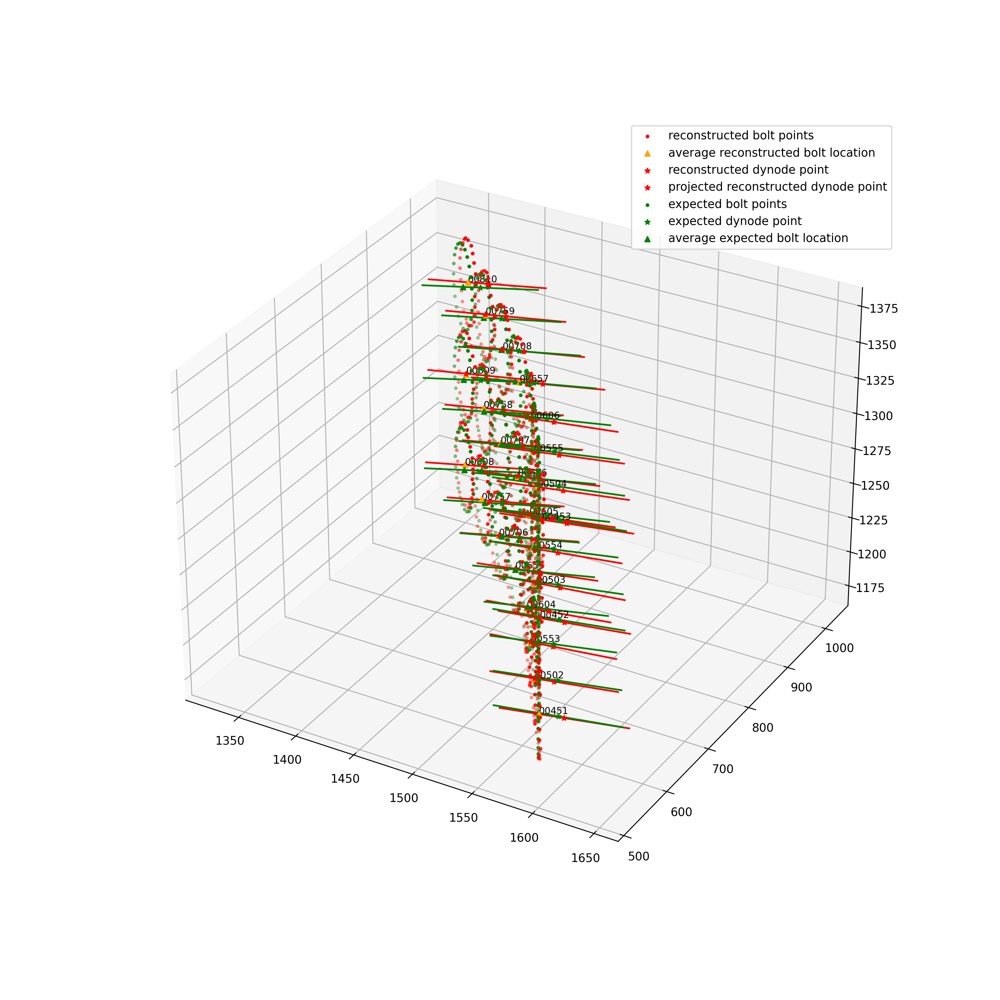

0.09123767138135322
00451-00, distance = 0.091 px
0.07783395968503619
X= [1645.7222762317006, 1552.8910822152343]
00452-00, distance = 0.078 px
0.6921312536281456
X= [1646.1947240517209, 1554.2591429094475]
00453-00, distance = 0.692 px
0.6349559452638918
X= [1615.0788990866893, 1523.0508909974067]
00502-00, distance = 0.635 px
0.5672097825392161
X= [1618.837298160978, 1526.7646369748702]
00503-00, distance = 0.567 px
0.8458892742274667
X= [1620.766284461608, 1527.8902502165552]
00504-00, distance = 0.846 px
0.27902961918809077
X= [1590.4646076421645, 1498.2443339550323]
00553-00, distance = 0.279 px
0.3984100965118745
X= [1593.411991971717, 1501.1079894678926]
00554-00, distance = 0.398 px
0.27804840285901145
X= [1593.9672032356536, 1501.6700994114133]
00555-00, distance = 0.278 px
0.5937295247367902
X= [1563.0179644976115, 1471.3839016646293]
00604-00, distance = 0.594 px
0.4258536024227256
X= [1565.0277682270337, 1473.8198034547456]
00605-00, distance = 0.426 px
0.32260086335511684


In [7]:

#print(camera_rotations, camera_translations)
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')

labelled = False
pmt_shift_distance_array = []
pmt_shift_distance_array_x = []
pmt_shift_distance_array_y = []
pmt_shift_distance_array_z = []
for chosenPMT in pmt_locations:
    #chosenPMT = "00810-00"
    
    #print(chosenPMT)
    
    expected_3D_dynode_centre = all_pmt_locations[chosenPMT]
    expected_3D_bolts = []
    for item in all_bolt_locations:
        if(chosenPMT[:-3] == item[:-3]):
            expected_3D_bolts.append((all_bolt_locations[item][0],all_bolt_locations[item][1],all_bolt_locations[item][2]))
            
    expected_3D_bolts_array = np.stack(list(expected_3D_bolts))
    expected_3D_average_bolt, expected_normal = sk.fit_plane(expected_3D_bolts_array)

    
    reconstructed_3D_dynode_centre = reco_locations[chosenPMT]
    reconstructed_3D_bolts = []
    for item in reco_locations:
        if(chosenPMT[:-3] == item[:-3] and item[-2:] != "00"):
            reconstructed_3D_bolts.append((reco_locations[item][0],reco_locations[item][1],reco_locations[item][2]))

    reconstructed_3D_bolts_array = np.stack(list(reconstructed_3D_bolts))
    reconstructed_3D_average_bolt, reconstructed_normal = sk.fit_plane(reconstructed_3D_bolts_array)

    #print(reconstructed_3D_average_bolt)
    #print(reconstructed_3D_dynode_centre)
    #print(reconstructed_normal)

    vector = reconstructed_3D_dynode_centre - reconstructed_3D_average_bolt
    projected_reconstructed_3D_dynode_centre = reconstructed_3D_dynode_centre - np.dot(vector,reconstructed_normal) * reconstructed_normal
    pmt_shift_distance = math.sqrt((projected_reconstructed_3D_dynode_centre[0]-reconstructed_3D_average_bolt[0])**2 +(projected_reconstructed_3D_dynode_centre[1]-reconstructed_3D_average_bolt[1])**2 +(projected_reconstructed_3D_dynode_centre[2]-reconstructed_3D_average_bolt[2])**2  )
    pmt_shift_distance_array.append(pmt_shift_distance)
    pmt_shift_distance_array_x.append(projected_reconstructed_3D_dynode_centre[0]-reconstructed_3D_average_bolt[0])
    pmt_shift_distance_array_y.append(projected_reconstructed_3D_dynode_centre[1]-reconstructed_3D_average_bolt[1])
    pmt_shift_distance_array_z.append(projected_reconstructed_3D_dynode_centre[2]-reconstructed_3D_average_bolt[2])
    
    print(pmt_shift_distance)
    vector = expected_3D_dynode_centre - expected_3D_average_bolt
    projected_expected_3D_dynode_centre = expected_3D_dynode_centre - np.dot(vector,expected_normal) * expected_normal
    #print(projected_expected_3D_dynode_centre)
    #print(expected_3D_average_bolt)
    if labelled == False:
        ax.scatter(reconstructed_3D_bolts_array[:,0], reconstructed_3D_bolts_array[:,1], reconstructed_3D_bolts_array[:,2], color="red", marker='.', label="reconstructed bolt points")
        ax.scatter(reconstructed_3D_average_bolt[0],reconstructed_3D_average_bolt[1],reconstructed_3D_average_bolt[2], color="orange", marker='^', label="average reconstructed bolt location")
        ax.scatter(reconstructed_3D_dynode_centre[0],reconstructed_3D_dynode_centre[1],reconstructed_3D_dynode_centre[2], color="red", marker = '*', label = "reconstructed dynode point")
        ax.scatter(projected_reconstructed_3D_dynode_centre[0],projected_reconstructed_3D_dynode_centre[1],projected_reconstructed_3D_dynode_centre[2], color="red", marker = '*', label = "projected reconstructed dynode point")
        X,Y,Z = [[reconstructed_3D_dynode_centre[i]-reconstructed_normal[i]*50, reconstructed_3D_dynode_centre[i]+reconstructed_normal[i]*50] for i in range(3)]
        ax.plot(X,Y,Z,color='red')

        ax.scatter(expected_3D_bolts_array[:,0], expected_3D_bolts_array[:,1], expected_3D_bolts_array[:,2], color="green", marker='.', label="expected bolt points")
        ax.scatter(expected_3D_dynode_centre[0],expected_3D_dynode_centre[1],expected_3D_dynode_centre[2], color="green", marker = '*', label = "expected dynode point")
        ax.scatter(expected_3D_average_bolt[0],expected_3D_average_bolt[1],expected_3D_average_bolt[2], color="green", marker = '^', label = "average expected bolt location")
        X,Y,Z = [[expected_3D_dynode_centre[i]-expected_normal[i]*50, expected_3D_dynode_centre[i]+expected_normal[i]*50] for i in range(3)]
        ax.plot(X,Y,Z,color='green')
        labelled = True
    else:
        ax.scatter(reconstructed_3D_bolts_array[:,0], reconstructed_3D_bolts_array[:,1], reconstructed_3D_bolts_array[:,2], color="red", marker='.')
        ax.scatter(reconstructed_3D_average_bolt[0],reconstructed_3D_average_bolt[1],reconstructed_3D_average_bolt[2], color="orange", marker='^')
        ax.scatter(reconstructed_3D_dynode_centre[0],reconstructed_3D_dynode_centre[1],reconstructed_3D_dynode_centre[2], color="red", marker = '*')
        ax.scatter(projected_reconstructed_3D_dynode_centre[0],projected_reconstructed_3D_dynode_centre[1],projected_reconstructed_3D_dynode_centre[2], color="red", marker = '*')
        X,Y,Z = [[reconstructed_3D_dynode_centre[i]-reconstructed_normal[i]*50, reconstructed_3D_dynode_centre[i]+reconstructed_normal[i]*50] for i in range(3)]
        print("X=",X)
        ax.plot(X,Y,Z,color='red')

        ax.scatter(expected_3D_bolts_array[:,0], expected_3D_bolts_array[:,1], expected_3D_bolts_array[:,2], color="green", marker='.')
        ax.scatter(expected_3D_dynode_centre[0],expected_3D_dynode_centre[1],expected_3D_dynode_centre[2], color="green", marker = '*')
        ax.scatter(expected_3D_average_bolt[0],expected_3D_average_bolt[1],expected_3D_average_bolt[2], color="green", marker = '^')
        X,Y,Z = [[expected_3D_dynode_centre[i]-expected_normal[i]*50, expected_3D_dynode_centre[i]+expected_normal[i]*50] for i in range(3)]
        ax.plot(X,Y,Z,color='green')
    
    ax.text(projected_reconstructed_3D_dynode_centre[0],projected_reconstructed_3D_dynode_centre[1],projected_reconstructed_3D_dynode_centre[2], chosenPMT[:-3],size=8, zorder=4, color='k')
    #plotFile.write(str(reconstructed_3D_bolts_array))
    #printAverage = "Average = " + str(round(pmt_shift_distance,2))
    title = str(chosenPMT)+", distance = "+str(round(pmt_shift_distance,3))+" px"
    print(str(chosenPMT)+", distance = "+str(round(pmt_shift_distance,3))+" px")
    #plt.title(title)
    
plt.legend(loc=0)
#fig.tight_layout()
plt.show()
outfile = open(chosenPMT+".pickle",'wb')
pickle.dump(fig,outfile)


print(pmt_shift_distance_array)

In [8]:
### Printing to a file instead of plotting directly.

#for chosenPMT in chosenPMTs:
plotFile = open("plotFile.txt", "w")

plotFile.write("reconstructed_bolts_array:\n")
reconstructed_bolts_array = []
reconstructed_average_bolt_array = []
reconstructed_dynode_centre_array = []
projected_reconstructed_dynode_centre_array = []

for chosenPMT in pmt_locations:
        
    reconstructed_3D_dynode_centre = reco_locations[chosenPMT]
    reconstructed_3D_bolts = []
    for item in reco_locations:
        if(chosenPMT[:-3] == item[:-3] and item[-2:] != "00"):
            reconstructed_3D_bolts.append((reco_locations[item][0],reco_locations[item][1],reco_locations[item][2]))

    reconstructed_3D_bolts_array = np.stack(list(reconstructed_3D_bolts))
    reconstructed_3D_average_bolt, reconstructed_normal = sk.fit_plane(reconstructed_3D_bolts_array)



    vector = reconstructed_3D_dynode_centre - reconstructed_3D_average_bolt
    projected_reconstructed_3D_dynode_centre = reconstructed_3D_dynode_centre - np.dot(vector,reconstructed_normal) * reconstructed_normal

    
    vector = expected_3D_dynode_centre - expected_3D_average_bolt
    projected_expected_3D_dynode_centre = expected_3D_dynode_centre - np.dot(vector,expected_normal) * expected_normal

    
   
    X,Y,Z = [[reconstructed_3D_dynode_centre[i]-reconstructed_normal[i]*50, reconstructed_3D_dynode_centre[i]+reconstructed_normal[i]*50] for i in range(3)]

        

        
    for bolt in reconstructed_3D_bolts_array:
        
        reconstructed_bolts_array.append((bolt[0],bolt[1],bolt[2]))
        plotFile.write("%s\t%s\t%s\n" %(bolt[0],bolt[1],bolt[2]))
        
    
    reconstructed_average_bolt_array.append((reconstructed_3D_average_bolt[0],reconstructed_3D_average_bolt[1],reconstructed_3D_average_bolt[2]))
    reconstructed_dynode_centre_array.append((reconstructed_3D_dynode_centre[0],reconstructed_3D_dynode_centre[1],reconstructed_3D_dynode_centre[2]))
    projected_reconstructed_dynode_centre_array.append((projected_reconstructed_3D_dynode_centre[0],projected_reconstructed_3D_dynode_centre[1],projected_reconstructed_3D_dynode_centre[2], chosenPMT[:-3]))
    
plotFile.write("reconstructed_average_bolt_array:\n")
for point in reconstructed_average_bolt_array:
    plotFile.write("%s\t%s\t%s\n" %(point[0], point[1], point[2]))
    
plotFile.write("reconstructed_dynode_centre_array:\n")
for point in reconstructed_dynode_centre_array:
    plotFile.write("%s\t%s\t%s\n" %(point[0], point[1], point[2]))


plotFile.write("projected_reconstructed_dynode_centre_array:\n")
for point in projected_reconstructed_dynode_centre_array:
    plotFile.write("%s\t%s\t%s\t%s\n" %(point[0], point[1], point[2], point[3]))               
plotFile.close()


In [7]:
errorAverage = sum(pmt_shift_distance_array) / len(pmt_shift_distance_array)
fig = plt.figure(figsize=(12,12))
n, bins, patches = plt.hist(pmt_shift_distance_array, 7, density=True, facecolor='g')
plt.xlabel('Error (pixels)')
plt.ylabel('Probability')
plt.title('Error - Distance Between Reprojected Dynode Centre and Reprojected Bolt Circle Centre')
printAverage = "Average = " + str(round(errorAverage,2))
plt.text(7, .8, printAverage,fontsize=12)
plt.xlim(0, 2)
plt.ylim(0, 5)
plt.grid(True)
plt.show()

<IPython.core.display.Javascript object>

In [8]:
errorAverage_x = sum(pmt_shift_distance_array_x) / len(pmt_shift_distance_array_x)
fig = plt.figure(figsize=(12,12))
n, bins, patches = plt.hist(pmt_shift_distance_array_x,6, facecolor='g')
plt.xlabel('Error (pixels)', size=25)
plt.ylabel('Frequency', size=25)
plt.title('Distance Between Projected Dynode Centre and Reprojected Bolt Circle Centre, X axis', size=30, wrap=True)


STD_x = np.std(pmt_shift_distance_array_x)
STD_x_error = STD_x / np.sqrt(len(pmt_shift_distance_array_x))
printSTD = "SD = " + str(round(STD_x,1)) + " cm"
printAverage = "AVG = " + str(round(errorAverage_x,2)) + " ± " + str(round(STD_x_error,2)) + " cm"


plt.text(0.007, 6.9, printAverage,fontsize=30)
plt.text(0.007, 6.5, printSTD, fontsize = 30)
plt.tick_params(axis='both', labelsize=20)
#plt.xlim(0, .25)
#plt.ylim(0, 5)
plt.grid(True)
plt.show()
plt.savefig("error-x.png")

<IPython.core.display.Javascript object>

In [9]:
errorAverage_y = sum(pmt_shift_distance_array_y) / len(pmt_shift_distance_array_y)
fig = plt.figure(figsize=(12,12))
n, bins, patches = plt.hist(pmt_shift_distance_array_y,6, facecolor='g')
plt.xlabel('Error (pixels)', size=25)
plt.ylabel('Frequency', size=25)
plt.title('Distance Between Projected Dynode Centre and Reprojected Bolt Circle Centre, Y axis', size=30, wrap=True)

STD_y = np.std(pmt_shift_distance_array_y)
STD_y_error = STD_y / np.sqrt(len(pmt_shift_distance_array_y))
printSTD = "SD = " + str(round(STD_y,1)) + " cm"

printAverage = "AVG = " + str(round(errorAverage_y,2)) + " ± " + str(round(STD_y_error,2)) + " cm"

plt.text(-0.515, 6.1, printAverage,fontsize=30)
plt.text(-0.515, 5.7, printSTD, fontsize = 30)

plt.tick_params(axis='both', labelsize=20)
#plt.xlim(0, .25)
#plt.ylim(0, 5)
plt.grid(True)
plt.show()
plt.savefig("error-y.png")

<IPython.core.display.Javascript object>

In [10]:
errorAverage_z = sum(pmt_shift_distance_array_z) / len(pmt_shift_distance_array_z)
fig = plt.figure(figsize=(12,12))
n, bins, patches = plt.hist(pmt_shift_distance_array_z,6, facecolor='g')
plt.xlabel('Error (pixels)', size=25)
plt.ylabel('Frequency', size=25)
plt.title('Distance Between Projected Dynode Centre and Reprojected Bolt Circle Centre, Z axis', size=30, wrap=True)

STD_z = np.std(pmt_shift_distance_array_z)
STD_z_error = STD_z / np.sqrt(len(pmt_shift_distance_array_z))
printSTD = "SD = " + str(round(STD_z,1)) + " cm"


printAverage = "AVG = " + str(round(errorAverage_z,2)) + " ± " + str(round(STD_z_error,2)) + " cm"


plt.text(-0.9, 6.1, printAverage,fontsize=30)
plt.text(-0.9, 5.7, printSTD, fontsize = 30)
#plt.text(-0.9, 5.3, printSTD_error, fontsize = 30)
plt.tick_params(axis='both', labelsize=20)
#plt.xlim(0, .25)
#plt.ylim(0, 5)
plt.grid(True)
plt.show()
plt.savefig("error-z.png")

<IPython.core.display.Javascript object>

In [11]:
### Printing to a file instead of plotting directly.
### SINGLE PMT

#for chosenPMT in chosenPMTs:
plotFile = open("plotFile-SinglePMT.txt", "w")

plotFile.write("reconstructed_bolts_array:\n")
reconstructed_bolts_array = []
reconstructed_average_bolt_array = []
reconstructed_dynode_centre_array = []
projected_reconstructed_dynode_centre_array = []

for chosenPMT in pmt_locations:
    if chosenPMT[:-3] == "00656":    
        reconstructed_3D_dynode_centre = reco_locations[chosenPMT]
        reconstructed_3D_bolts = []
        for item in reco_locations:
            if(chosenPMT[:-3] == item[:-3] and item[-2:] != "00"):
                reconstructed_3D_bolts.append((reco_locations[item][0],reco_locations[item][1],reco_locations[item][2]))

        reconstructed_3D_bolts_array = np.stack(list(reconstructed_3D_bolts))
        reconstructed_3D_average_bolt, reconstructed_normal = sk.fit_plane(reconstructed_3D_bolts_array)



        vector = reconstructed_3D_dynode_centre - reconstructed_3D_average_bolt
        projected_reconstructed_3D_dynode_centre = reconstructed_3D_dynode_centre - np.dot(vector,reconstructed_normal) * reconstructed_normal


        vector = expected_3D_dynode_centre - expected_3D_average_bolt
        projected_expected_3D_dynode_centre = expected_3D_dynode_centre - np.dot(vector,expected_normal) * expected_normal



        X,Y,Z = [[reconstructed_3D_dynode_centre[i]-reconstructed_normal[i]*50, reconstructed_3D_dynode_centre[i]+reconstructed_normal[i]*50] for i in range(3)]




        for bolt in reconstructed_3D_bolts_array:

            reconstructed_bolts_array.append((bolt[0],bolt[1],bolt[2]))
            plotFile.write("%s\t%s\t%s\n" %(bolt[0],bolt[1],bolt[2]))


        reconstructed_average_bolt_array.append((reconstructed_3D_average_bolt[0],reconstructed_3D_average_bolt[1],reconstructed_3D_average_bolt[2]))
        reconstructed_dynode_centre_array.append((reconstructed_3D_dynode_centre[0],reconstructed_3D_dynode_centre[1],reconstructed_3D_dynode_centre[2]))
        projected_reconstructed_dynode_centre_array.append((projected_reconstructed_3D_dynode_centre[0],projected_reconstructed_3D_dynode_centre[1],projected_reconstructed_3D_dynode_centre[2], chosenPMT[:-3]))

plotFile.write("reconstructed_average_bolt_array:\n")
for point in reconstructed_average_bolt_array:
    plotFile.write("%s\t%s\t%s\n" %(point[0], point[1], point[2]))

plotFile.write("reconstructed_dynode_centre_array:\n")
for point in reconstructed_dynode_centre_array:
    plotFile.write("%s\t%s\t%s\n" %(point[0], point[1], point[2]))


plotFile.write("projected_reconstructed_dynode_centre_array:\n")
for point in projected_reconstructed_dynode_centre_array:
    plotFile.write("%s\t%s\t%s\t%s\n" %(point[0], point[1], point[2], point[3]))               
plotFile.close()


HI
